# VIP - Vortex Image Processing package

-----------

To use this notebook you have to type :

pip install vip_hci


Let's assume ``VIP`` and ``HCIplot`` are properly installed. We import the packages along with other useful libraries:

In [1]:
%matplotlib inline
from matplotlib.pyplot import *
import numpy as np
import scipy.io as sio
import vip_hci as vip
from hciplot import plot_frames, plot_cubes
from astropy.io import fits


# 1. Loading ADI data

Here we will inspect the HR8799 dataset taking using VLT sphere in order to demonstrate the capabilities of star hopping : (Wahhaj et al 2021). It contains the image cubes of the HR8799 dataset.

Let's inspect the fits file:

In [63]:
simg = sio.readsav("imcbasic1.save")

It contains a cube and its correspoding parallactic angles. An ADI sequence is acquired in pupil tracking mode, which means that the instrument field derotator remains off, thereby keeping the instrument and telescope optics aligned while the image rotates with time.


Now we load the data "in" memory with the functions below:

In [64]:
cube_orig = simg["imc"]
angs = simg["pas"]

In [4]:
len(cube_orig)

481

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
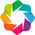

For instance, instead of opts('Points (size=5)', points) use points.opts(opts.Points(size=5))


:Dataset   [x,y,time]   (flux)
:Cube_shape	[351, 351, 481]


:DynamicMap   [time]
   :Image   [x,y]   (flux)

In [67]:
import matplotlib.pyplot as plt
plot_cubes(cube_orig, vmin=0, vmax=400,backend='bokeh',origin = "lower")
#plt.imshow(cube_orig[0])

[Go to the top](#Table-of-contents)

In [68]:
cube = cube_orig 
imlib_rot = 'vip-fft'
interpolation=None

## 2. ADI median subtraction

The most simple approach is to model the PSF with the median of the ADI sequence. The median subtraction algorithm is the original post-processing approach proposed for ADI data (see Marois et al. 2006):

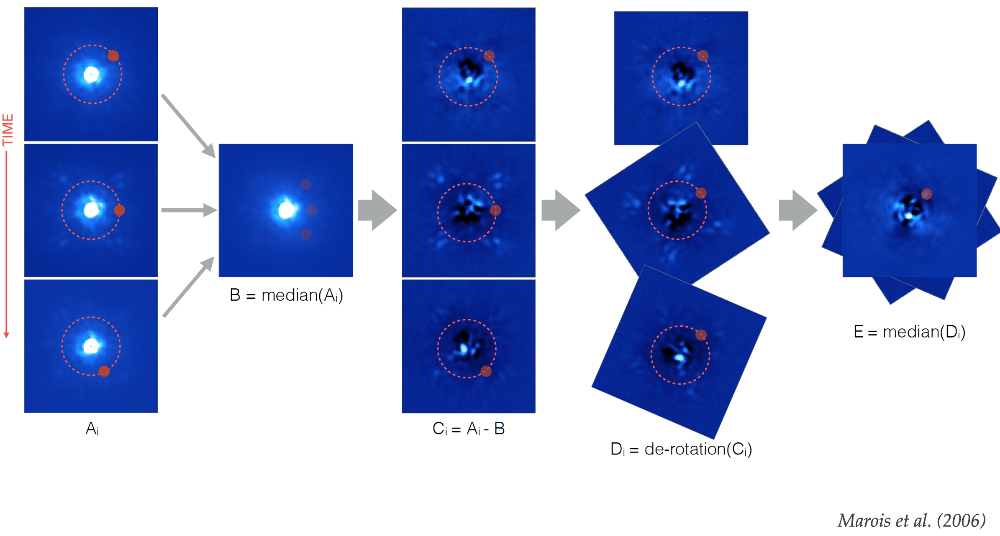

In [69]:
#fr_adi = median_sub(cube, -angs, mode='fullfr', imlib=imlib_rot, interpolation=interpolation)
fr_adi = vip.medsub.median_sub(cube, -angs, mode='fullfr')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2022-07-01 11:35:20
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Median psf reference subtracted
Done derotating and combining
Running time:  0:00:04.284193
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


For the annular mode, using a parallactic angle threshold:

In [70]:
fr_adi_an = vip.medsub.median_sub(cube,-angs, asize=1, mode='annular', delta_rot=0.5, nframes=4)
#fr_adi_an = median_sub(cube,-angs, asize=1, mode='annular', delta_rot=0.5, nframes=4)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2022-07-01 11:35:48
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 175, FWHM = 4
Processing annuli:
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:01:47


/home/swastik/anaconda3/lib/python3.8/site-packages/vip_hci/medsub/medsub_source.py:154: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res)


Optimized median psf reference subtracted
Done derotating and combining
Running time:  0:01:52.807847
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


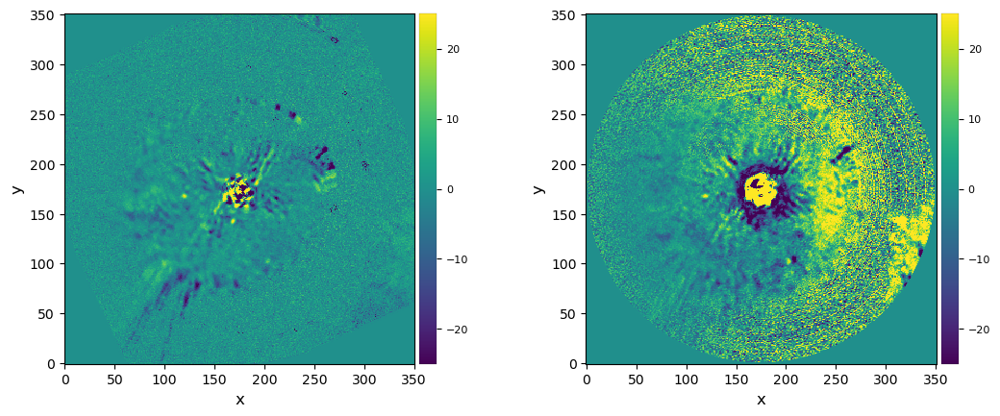

In [40]:
plot_frames((fr_adi, fr_adi_an), vmin=-25, vmax=25)
#plot_cubes(cube_orig, vmin=0, vmax=400,backend='bokeh',origin = "lower")


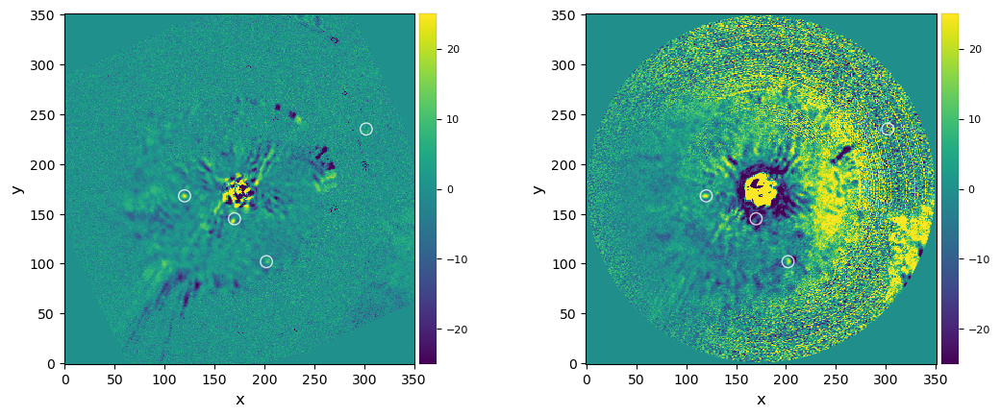

In [51]:
plot_frames((fr_adi, fr_adi_an), vmin=-25, vmax=25,circle=((120,168),(170,145),(202,102),(302,235)))


[Go to the top](#Table-of-contents)

## 2.1 Pairwise frame differencing

Another simple approach is to perform pairwise frame subtraction, taking into account a rotation threshold. This is similar to the algorithm proposed by Hegelber et al 2015. This implementation can also impose a distance threshold (similarity)

In [43]:
fr_fdiff =  vip.frdiff.frame_diff(cube, -angs, metric='l1', dist_threshold=90, 
                                 delta_rot=0.2, radius_int=4, asize=4, nproc=1, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2022-07-01 11:17:00
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
42 annuli. Performing pair-wise subtraction:
Ann 1    PA thresh:  7.63    Ann center:   6    N segments: 1 
Ann 2    PA thresh:  4.58    Ann center:  10    N segments: 1 
Ann 3    PA thresh:  3.27    Ann center:  14    N segments: 1 
Ann 4    PA thresh:  2.55    Ann center:  18    N segments: 1 
Ann 5    PA thresh:  2.08    Ann center:  22    N segments: 1 
Ann 6    PA thresh:  1.76    Ann center:  26    N segments: 1 
Ann 7    PA thresh:  1.53    Ann center:  30    N segments: 1 
Ann 8    PA thresh:  1.35    Ann center:  34    N segments: 1 
Ann 9    PA thresh:  1.21    Ann center:  38    N segments: 1 
Ann 10    PA thresh:  1.09    Ann center:  42    N segments: 1 
Ann 11    PA thresh:  1.00    Ann center:  46    N segments: 1 
Ann 12    PA thresh:  0.92    Ann center:  50    N segments: 1 

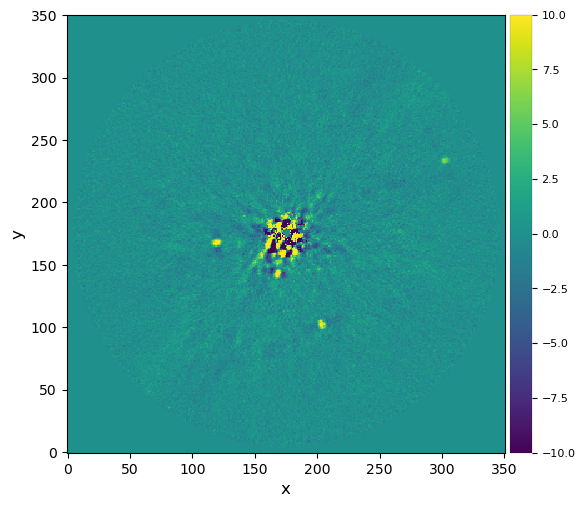

In [44]:
plot_frames(fr_fdiff,vmin=-10, vmax=10)

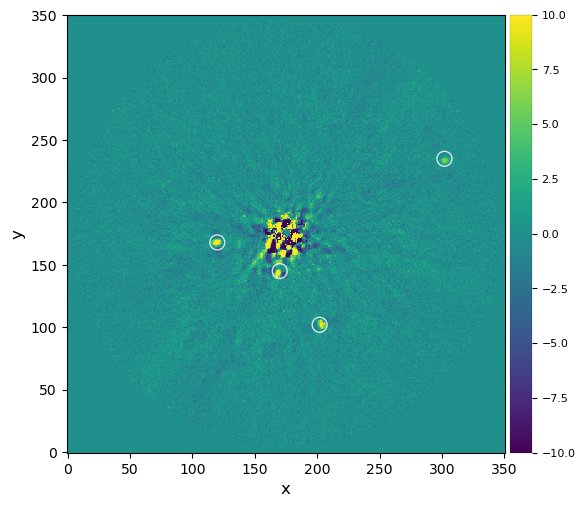

In [49]:
plot_frames(fr_fdiff,vmin=-10, vmax=10,circle=((120,168),(170,145),(202,102),(302,235)))

[Go to the top](#Table-of-contents)

## 2.2. Full-frame PCA

Now let's try the PCA based algorithms (Amara & Quanz 2012, Soummer et al. 2012) in `vip.pca`:

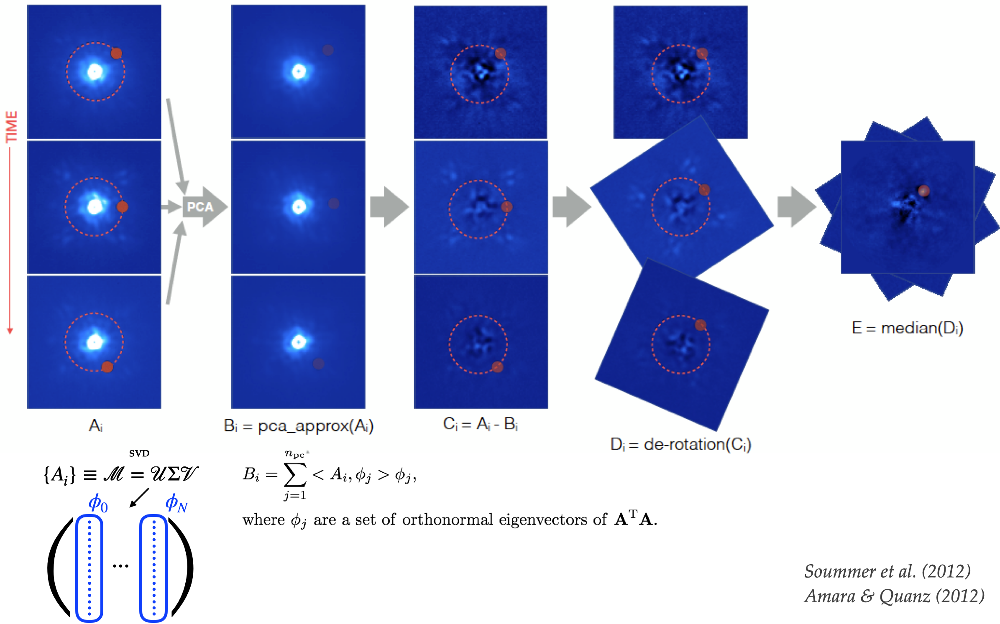

**Figure 3.2** - PCA-ADI concept. Compared to median-ADI (Fig. 3.1), only the model used for subtraction is refined. It is constructed from the projection of each image on the first $n_{\rm pc}$ principal components. The principal components are typically found by singular value decomposition, after converting the observed sequence of images $A_i$ into a 2D matrix (rows: time dimension, columns: linearized version of the images).

In [52]:
fr_pca1 = vip.pca.pca(cube, -angs, ncomp=4, mask_center_px=None)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2022-07-01 11:25:12
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 8.236 GB
System available memory = 3.654 GB
Done vectorizing the frames. Matrix shape: (481, 123201)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:07.174236
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:00:10.318685
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Here we compare the median subtraction with the PCA result (on the right). The improvement is clear:

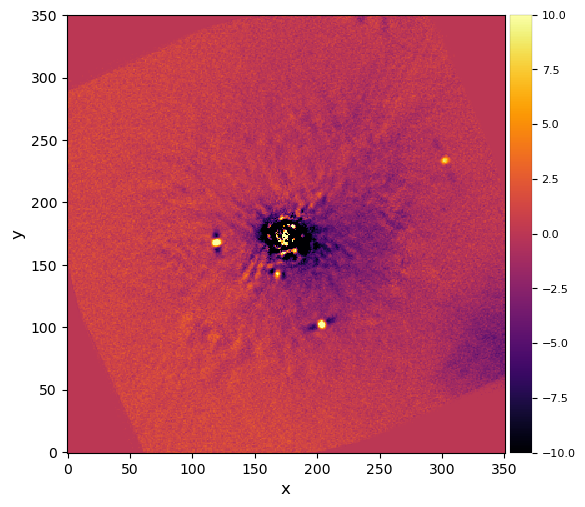

In [57]:
plot_frames((fr_pca1),vmin=-10, vmax=10,cmap='inferno')

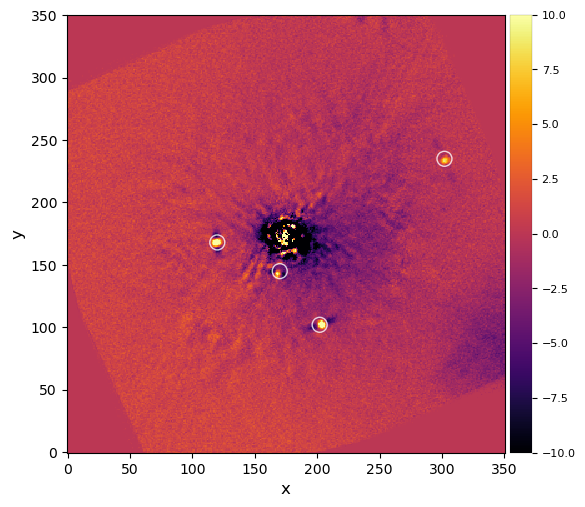

In [58]:
plot_frames((fr_pca1),vmin=-10, vmax=10,circle=((120,168),(170,145),(202,102),(302,235)),cmap='inferno')

We can partially avoid the companion self-subtraction with full-frame PCA by applying a PA threshold for a given distance from the center (exploiting the ~80 degrees of rotation). The PCA function in ``VIP`` accepts a parameter `source_xy` for defining this location and the corresponding PA threshold. The parameter `delta_rot` sets the amount of rotation in terms of the FWHM for rejecting frames from the library.

In [59]:
fr_pca_optlib = vip.pca.pca(cube, -angs, ncomp=30)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2022-07-01 11:27:32
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 8.236 GB
System available memory = 3.733 GB
Done vectorizing the frames. Matrix shape: (481, 123201)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:08.031375
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:00:11.341479
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


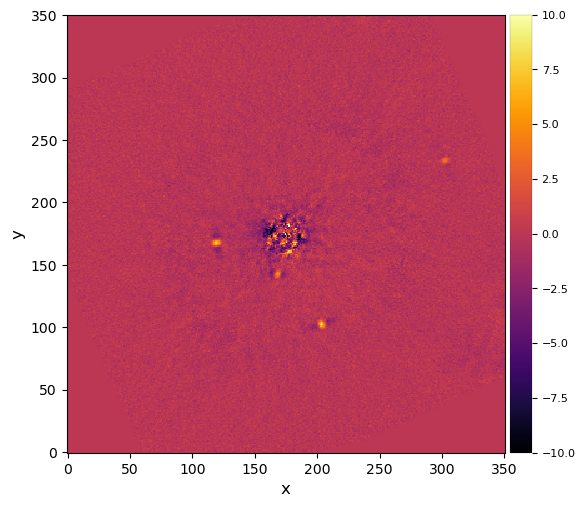

In [61]:
plot_frames(fr_pca_optlib,vmin=-10, vmax=10,cmap='inferno')

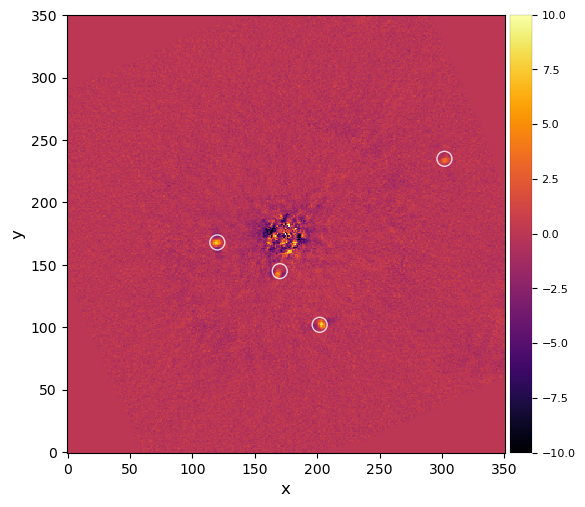

In [62]:
plot_frames(fr_pca_optlib,vmin=-10, vmax=10,circle=((120,168),(170,145),(202,102),(302,235)),cmap='inferno')